In [52]:
import pandas as pd # dataframe manipulation
import numpy as np # linear algebra

# data visualization
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns
import shap

# sklearn 
from sklearn.cluster import KMeans
from sklearn.preprocessing import PowerTransformer, OrdinalEncoder
from sklearn.pipeline import Pipeline
from sklearn.manifold import TSNE
from sklearn.metrics import silhouette_score, silhouette_samples, accuracy_score, classification_report

from pyod.models.ecod import ECOD
from yellowbrick.cluster import KElbowVisualizer

import lightgbm as lgb
import prince

In [53]:
def get_pca_2d(df, predict):

    pca_2d_object = prince.PCA(
    n_components=2,
    n_iter=3,
    rescale_with_mean=True,
    rescale_with_std=True,
    copy=True,
    check_input=True,
    engine='sklearn',
    random_state=42
    )

    pca_2d_object.fit(df)

    df_pca_2d = pca_2d_object.transform(df)
    df_pca_2d.columns = ["comp1", "comp2"]
    df_pca_2d["cluster"] = predict

    return pca_2d_object, df_pca_2d



def get_pca_3d(df, predict):

    pca_3d_object = prince.PCA(
    n_components=3,
    n_iter=3,
    rescale_with_mean=True,
    rescale_with_std=True,
    copy=True,
    check_input=True,
    engine='sklearn',
    random_state=42
    )

    pca_3d_object.fit(df)

    df_pca_3d = pca_3d_object.transform(df)
    df_pca_3d.columns = ["comp1", "comp2", "comp3"]
    df_pca_3d["cluster"] = predict

    return pca_3d_object, df_pca_3d



def plot_pca_3d(df, title = "PCA Space", opacity=0.8, width_line = 0.1):

    df = df.astype({"cluster": "object"})
    df = df.sort_values("cluster")

    fig = px.scatter_3d(df, 
                        x='comp1', 
                        y='comp2', 
                        z='comp3',
                        color='cluster',
                        template="plotly",
                        
                        # symbol = "cluster",
                        
                        color_discrete_sequence=px.colors.qualitative.Vivid,
                        title=title).update_traces(
                            # mode = 'markers',
                            marker={
                                "size": 4,
                                "opacity": opacity,
                                # "symbol" : "diamond",
                                "line": {
                                    "width": width_line,
                                    "color": "black",
                                }
                            }
                        ).update_layout(
                                width = 1000, 
                                height = 800, 
                                autosize = False, 
                                showlegend = True,
                                legend=dict(title_font_family="Times New Roman",
                                            font=dict(size= 20)),
                                scene = dict(xaxis=dict(title = 'comp1', titlefont_color = 'black'),
                                            yaxis=dict(title = 'comp2', titlefont_color = 'black'),
                                            zaxis=dict(title = 'comp3', titlefont_color = 'black')),
                                font = dict(family = "Gilroy", color  = 'black', size = 15))
                      
    
    fig.show()


def plot_pca_2d(df, title = "PCA Space", opacity=0.8, width_line = 0.1):

    df = df.astype({"cluster": "object"})
    df = df.sort_values("cluster")

    fig = px.scatter(df, 
                        x='comp1', 
                        y='comp2', 
                        color='cluster',
                        template="plotly",
                        # symbol = "cluster",
                        
                        color_discrete_sequence=px.colors.qualitative.Vivid,
                        title=title).update_traces(
                            # mode = 'markers',
                            marker={
                                "size": 8,
                                "opacity": opacity,
                                # "symbol" : "diamond",
                                "line": {
                                    "width": width_line,
                                    "color": "black",
                                }
                            }
                        ).update_layout(
                                width = 800, 
                                height = 700, 
                                autosize = False, 
                                showlegend = True,
                                legend=dict(title_font_family="Times New Roman",
                                            font=dict(size= 20)),
                                scene = dict(xaxis=dict(title = 'comp1', titlefont_color = 'black'),
                                            yaxis=dict(title = 'comp2', titlefont_color = 'black'),
                                            ),
                                font = dict(family = "Gilroy", color  = 'black', size = 15))
                        
        
    fig.show()

## Method 3: Sentence Embeddings + Kmeans

Sentence embedding is carried out by so-called transforms, algorithms specialized in this coding. Typically you can choose what the size of the numerical vector coming from this encoding is. And here is one of the key points:

    Thanks to the large dimension of the vector created by embedding, small variations in the data can be seen with greater precision.

This is the idea we are pursuing and these are its steps:

* Transform our original dataset through Sentence embedding
* Create a Kmeans model
* Evaluate it

### Preprocessed
Well, the first step is to encode the information through Sentence embedding. What is intended is to take the information of each client and unify it into text that contains all its characteristics. This part takes a lot of computing time. That’s why I created a script that did this job, call embedding_creation.py.

* **Step 1**: The text is created for each row, which contains the complete customer/row information. We also store it in a python list for later use. 

* **Step 2**: This is when the call to the transformer is made. For this we are going to use the model stored in HuggingFace. This model is specifically trained to perform embedding at the sentence level is “sentence-transformers/paraphrase-MiniLM-L6-v2”. The numerical vector that is returned to us for each text will be normalized, since the Kmeans model is sensitive to the scales of the inputs. The vectors created have a length of 384.

* **Step 3**: Finally we obtain the dataframe from the embedding, which will be the input of our Kmeans model.

In [54]:
# Normal Dataset
df = pd.read_csv("data/train.csv", sep = ";")
df = df.iloc[:, 0:8]

# Embedding Dataset
df_embedding = pd.read_csv("data/embedding_train.csv", sep = ",")

### Outliers

In [55]:
from pyod.models.ecod import ECOD
# https://github.com/yzhao062/pyod

clf = ECOD()
clf.fit(df_embedding)


out = clf.predict(df_embedding) 
df_embedding["outliers"] = out
df["outliers"] = out

df_embedding_no_out = df_embedding[df_embedding["outliers"] == 0]
df_embedding_no_out = df_embedding_no_out.drop(["outliers"], axis = 1)


df_embedding_with_out = df_embedding.copy()
df_embedding_with_out = df_embedding_with_out.drop(["outliers"], axis = 1)

In [56]:
print(df_embedding_no_out.shape)
print(df_embedding_with_out.shape)

(40690, 384)
(45211, 384)


### Modeling 

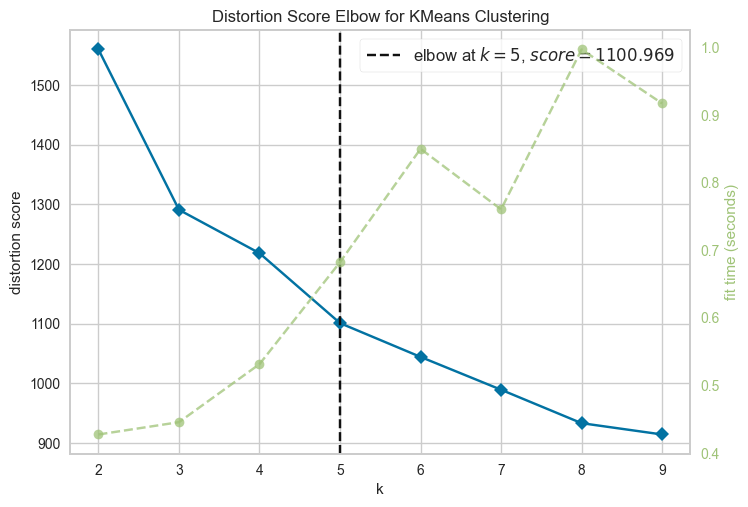

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [57]:
from yellowbrick.cluster import KElbowVisualizer

# Instantiate the clustering model and visualizer
km = KMeans(init = "k-means++", random_state=0, n_init="auto")
visualiser = KElbowVisualizer(km, k = (2,10))

# fit the data
visualiser.fit(df_embedding_no_out)
visualiser.show()

In [58]:
# def make_Silhouette_plot(X, n_clusters):
#     plt.xlim([-0.1, 1])
#     plt.ylim([0, len(X) + (n_clusters + 1) * 10])
#     clusterer = KMeans(n_clusters=n_clusters, max_iter = 1000, n_init = 10, init = 'k-means++', random_state=10)
#     cluster_labels = clusterer.fit_predict(X)
#     silhouette_avg = silhouette_score(X, cluster_labels)
#     print(
#         "For n_clusters =", n_clusters,
#         "The average silhouette_score is :", silhouette_avg,
#     )
# # Compute the silhouette scores for each sample
#     sample_silhouette_values = silhouette_samples(X, cluster_labels)
#     y_lower = 10
#     for i in range(n_clusters):
#         ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
#         ith_cluster_silhouette_values.sort()
#         size_cluster_i = ith_cluster_silhouette_values.shape[0]
#         y_upper = y_lower + size_cluster_i
#         color = cm.nipy_spectral(float(i) / n_clusters)
#         plt.fill_betweenx(
#             np.arange(y_lower, y_upper),
#             0,
#             ith_cluster_silhouette_values,
#             facecolor=color,
#             edgecolor=color,
#             alpha=0.7,
#         )
#         plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
#         y_lower = y_upper + 10
#         plt.title(f"The Silhouette Plot for n_cluster = {n_clusters}", fontsize=26)
#         plt.xlabel("The silhouette coefficient values", fontsize=24)
#         plt.ylabel("Cluster label", fontsize=24)
#         plt.axvline(x=silhouette_avg, color="red", linestyle="--")
#         plt.yticks([])  
#         plt.xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])
    
# range_n_clusters = list(range(2,10))
# for n_clusters in range_n_clusters:
#     print(f"N cluster: {n_clusters}")
#     make_Silhouette_plot(df_embedding_no_out, n_clusters)   
#     plt.savefig('silhouette_plot_with_embeds/Silhouette_plot_{}.png'.format(n_clusters))
#     plt.close()

<div style="display: flex; justify-content: space-between;">
    <img src="silhouette_plot_with_embeds/Silhouette_plot_2.png" alt="Alt text" width="400"/>
    <img src="silhouette_plot_with_embeds/Silhouette_plot_5.png" alt="Alt text" width="400"/>
    <img src="silhouette_plot_with_embeds/Silhouette_plot_8.png" alt="Alt text" width="400"/>
</div>

<div style="display: flex; justify-content: space-between;">
    <img src="silhouette_plot_with_embeds/Silhouette_plot_3.png" alt="Alt text" width="400"/>
    <img src="silhouette_plot_with_embeds/Silhouette_plot_6.png" alt="Alt text" width="400"/>
    <img src="silhouette_plot_with_embeds/Silhouette_plot_9.png" alt="Alt text" width="400"/>
</div>

<div style="display: flex; justify-content: space-between;">
    <img src="silhouette_plot_with_embeds/Silhouette_plot_4.png" alt="Alt text" width="400"/>
    <img src="silhouette_plot_with_embeds/Silhouette_plot_7.png" alt="Alt text" width="400"/>
</div>

The best number is 4-5

In [59]:
n_clusters = 5
clusters = KMeans(n_clusters=n_clusters, init = "k-means++").fit(df_embedding_no_out)
print(clusters.inertia_)
clusters_predict = clusters.predict(df_embedding_no_out)

1137.692948081282


### Evaluation

In [60]:
from sklearn.metrics import silhouette_score
from sklearn.metrics import calinski_harabasz_score
from sklearn.metrics import davies_bouldin_score

"""
The Davies Bouldin index is defined as the average similarity measure of each cluster with its most similar cluster, where similarity is the ratio of within-cluster distances to between-cluster distances.
The minimum value of the DB Index is 0, whereas a smaller value (closer to 0) represents a better model that produces better clusters.
"""
print(f"Davies bouldin score: {davies_bouldin_score(df_embedding_no_out,clusters_predict)}")

"""
Calinski Harabaz Index -> Variance Ratio Criterion.
Calinski Harabaz Index is defined as the ratio of the sum of between-cluster dispersion and of within-cluster dispersion.
The higher the index the more separable the clusters.
"""
print(f"Calinski Score: {calinski_harabasz_score(df_embedding_no_out,clusters_predict)}")


"""
The silhouette score is a metric used to calculate the goodness of fit of a clustering algorithm, but can also be used as a method for determining an optimal value of k (see here for more).
Its value ranges from -1 to 1.
A value of 0 indicates clusters are overlapping and either the data or the value of k is incorrect.
1 is the ideal value and indicates that clusters are very dense and nicely separated.
"""
print(f"Silhouette Score: {silhouette_score(df_embedding_no_out,clusters_predict)}")

Davies bouldin score: 1.8038305333955484
Calinski Score: 5840.764920994554
Silhouette Score: 0.18077483943511757


In [61]:
pca_3d_object, df_pca_3d = get_pca_3d(df_embedding_no_out, clusters_predict)
plot_pca_3d(df_pca_3d, title = "PCA Space", opacity=1, width_line = 0.1)
print("The variability is :", pca_3d_object.eigenvalues_summary)

/Users/luther/.local/share/virtualenvs/customer_segmentation-eqxHvxcv/lib/python3.10/site-packages/plotly/express/_core.py:2065: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



The variability is :           eigenvalue % of variance % of variance (cumulative)
component                                                    
0             65.560        17.07%                     17.07%
1             50.054        13.03%                     30.11%
2             39.666        10.33%                     40.44%


It can be seen that the clusters are much better differentiated than with the traditional method. This is good news. Let us remember that it is important to take into account the variability contained in the first 3 components of our PCA analysis. From experience, I can say that when it is around 50% (3D PCA) more or less clear conclusions can be drawn.

We see then that it is 40.44% cumulative variability of the 3 components, it is acceptable but not ideal.
One way I can visually see how compact the clusters are is by modifying the opacity of the points in the 3D representation. This means that when the points are agglomerated in a certain space, a black spot can be observed

In [62]:
# plot_pca_3d(df_pca_3d, title = "PCA Space", opacity=0.2, width_line = 0.1)

As can be seen, there are several points in space where the points of the same cluster cluster together. This indicates that they are well differentiated from the other points and that the model knows how to recognize them quite well.
Even so, it can be seen that various clusters cannot be differentiated well (Ex: cluster 1 and 3). For this reason, we carry out a t-SNE analysis, which we remember is a method that allows reducing dimensionality, taking into account complex polynomial relationships.

In [63]:
sampling_data = df_embedding_no_out.sample(frac=0.5, replace=True, random_state=1)
sampling_clusters = pd.DataFrame(clusters_predict).sample(frac=0.5, replace=True, random_state=1)[0].values

df_tsne_3d = TSNE(
                  n_components=3, 
                  learning_rate=500, 
                  init='random', 
                  perplexity=200, 
                  n_iter = 5000).fit_transform(sampling_data)

df_tsne_3d = pd.DataFrame(df_tsne_3d, columns=["comp1", "comp2",'comp3'])
df_tsne_3d["cluster"] = sampling_clusters
plot_pca_3d(df_tsne_3d, title = "T-SNE Space", opacity=1, width_line = 0.1)

/Users/luther/.local/share/virtualenvs/customer_segmentation-eqxHvxcv/lib/python3.10/site-packages/plotly/express/_core.py:2065: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



A noticeable improvement is seen. The clusters do not overlap each other and there is a clear differentiation between points. The improvement obtained using the second dimensionality reduction method is notable. Let’s see a 2D comparison:

In [64]:
plot_pca_3d(df_tsne_3d, title = "T-SNE Space", opacity=0.1, width_line = 0.1)

/Users/luther/.local/share/virtualenvs/customer_segmentation-eqxHvxcv/lib/python3.10/site-packages/plotly/express/_core.py:2065: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



In [65]:
df_tsne_2d = TSNE(
                  n_components=2, 
                  learning_rate=500, 
                  init='random', 
                  perplexity=200, 
                  n_iter = 5000).fit_transform(sampling_data)

df_tsne_2d = pd.DataFrame(df_tsne_2d, columns=["comp1", "comp2"])
df_tsne_2d["cluster"] = sampling_clusters

plot_pca_2d(df_tsne_2d, title = "PCA Space", opacity=0.5, width_line = 0.5)

/Users/luther/.local/share/virtualenvs/customer_segmentation-eqxHvxcv/lib/python3.10/site-packages/plotly/express/_core.py:2065: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



In [66]:
plot_pca_2d(df_tsne_2d, title = "PCA Space", opacity=1, width_line = 0.5)

/Users/luther/.local/share/virtualenvs/customer_segmentation-eqxHvxcv/lib/python3.10/site-packages/plotly/express/_core.py:2065: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



In [67]:
pca_2d_object, df_pca_2d = get_pca_2d(df_embedding_no_out, clusters_predict)
plot_pca_2d(df_pca_2d, title = "PCA Space", opacity=1, width_line = 0.2)

/Users/luther/.local/share/virtualenvs/customer_segmentation-eqxHvxcv/lib/python3.10/site-packages/plotly/express/_core.py:2065: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



In [68]:
df_no_outliers = df[df["outliers"] == 0]
df_no_outliers = df_no_outliers.drop("outliers", axis = 1)

In [69]:
df_no_outliers.head()

,age,job,marital,education,default,balance,housing,loan
0,58,management,married,tertiary,no,2143,yes,no
1,44,technician,single,secondary,no,29,yes,no
3,47,blue-collar,married,unknown,no,1506,yes,no
5,35,management,married,tertiary,no,231,yes,no
6,28,management,single,tertiary,no,447,yes,yes


Again, it can be seen that the clusters in the t-SNE are more separated and better differentiated than with the PCA. Furthermore, the difference between the two methods in terms of quality is smaller than when using the traditional Kmeans method.

To understand which variables our Kmeans model relies on, we do the same move as before: we create a classification model (LGBMClassifier) and analyze the importance of the features.

In [70]:
import lightgbm as lgb
import shap


clf_km = lgb.LGBMClassifier(colsample_bytree=0.8)



for col in ["job", "marital", "education", "housing", "loan", "default"]:
    df_no_outliers[col] = df_no_outliers[col].astype('category')

# # clf_km.fit(X = df_prueba, y = predict_embedding, feature_name='auto', categorical_feature = 'auto')


In [71]:
clf_km.fit(X = df_no_outliers , y = clusters_predict, feature_name = "auto", categorical_feature = "auto")

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001278 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 355
[LightGBM] [Info] Number of data points in the train set: 40690, number of used features: 8
[LightGBM] [Info] Start training from score -0.822803
[LightGBM] [Info] Start training from score -2.785700
[LightGBM] [Info] Start training from score -1.688283
[LightGBM] [Info] Start training from score -1.530322
[LightGBM] [Info] Start training from score -2.324701
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LGBMClassifier(colsample_bytree=0.8)

In [72]:
df_no_outliers.head()

,age,job,marital,education,default,balance,housing,loan
0,58,management,married,tertiary,no,2143,yes,no
1,44,technician,single,secondary,no,29,yes,no
3,47,blue-collar,married,unknown,no,1506,yes,no
5,35,management,married,tertiary,no,231,yes,no
6,28,management,single,tertiary,no,447,yes,yes


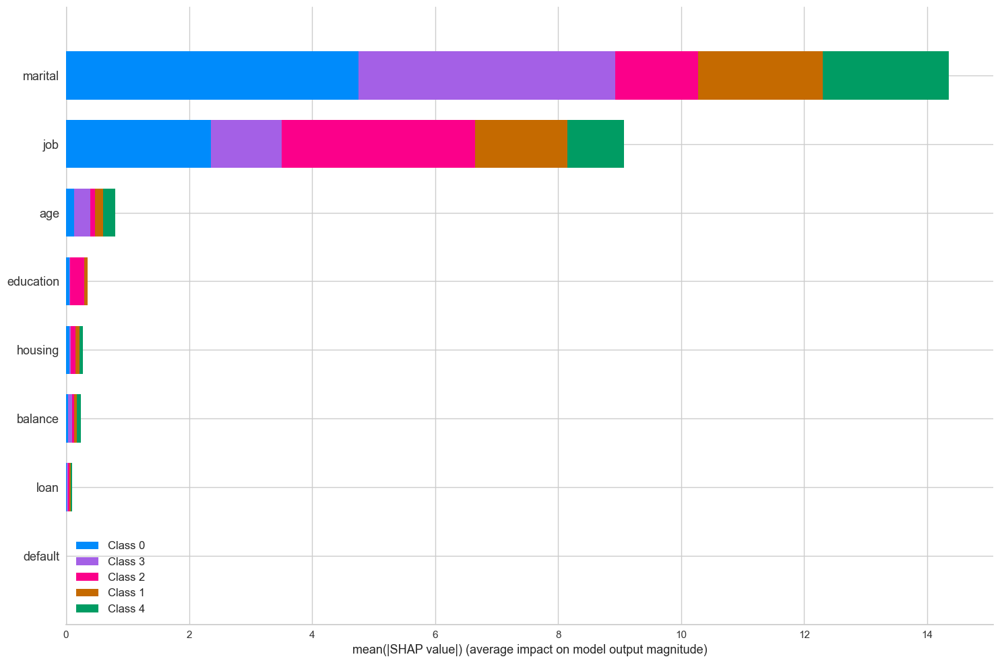

In [73]:
#SHAP values
explainer_km = shap.TreeExplainer(clf_km)
shap_values_km = explainer_km.shap_values(df_no_outliers)
shap.summary_plot(shap_values_km, df_no_outliers, plot_type="bar", plot_size=(15, 10))

We see then that this model is based above all on the **“marital”** and **“job”** variables. On the other hand we see that there are variables that do not provide much information. In a real case, a new version of the model should be created without these variables with little information.

**The Kmeans + Embedding model is more optimal since it needs fewer variables to be able to give good predictions.** 

In [74]:
y_pred = clf_km.predict(df_no_outliers)
accuracy=accuracy_score(y_pred, clusters_predict)
print('Training-set accuracy score: {0:0.4f}'. format(accuracy))
print(classification_report(clusters_predict, y_pred))

Training-set accuracy score: 1.0000
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     17871
           1       1.00      1.00      1.00      2510
           2       1.00      1.00      1.00      7521
           3       1.00      1.00      1.00      8808
           4       1.00      1.00      1.00      3980

    accuracy                           1.00     40690
   macro avg       1.00      1.00      1.00     40690
weighted avg       1.00      1.00      1.00     40690



In [75]:
df_no_outliers["cluster"] = clusters_predict

df_group = df_no_outliers.groupby('cluster').agg(
    {
        'job': lambda x: x.value_counts().index[0],
        'marital': lambda x: x.value_counts().index[0],
        'education': lambda x: x.value_counts().index[0],
        'housing': lambda x: x.value_counts().index[0],
        'loan': lambda x: x.value_counts().index[0],
        'age':'mean',
        'balance': 'mean',
        'default': lambda x: x.value_counts().index[0],
        
    }
).sort_values("job").reset_index()
df_group

,cluster,job,marital,education,housing,loan,age,balance,default
0,2,blue-collar,married,secondary,yes,no,41.713735,1072.667730,no
1,0,management,married,secondary,yes,no,43.952157,1524.040177,no
2,3,management,single,secondary,yes,no,34.089805,1257.703451,no
3,4,management,divorced,secondary,yes,no,45.817085,1213.524121,no
4,1,technician,single,secondary,yes,no,33.962550,1237.921116,no


Something very curious happens: the clusters where the most frequent position is that of **“management”** are 3. In them we find a very peculiar behavior where the single managers are younger, those who are married are older and the divorced are the how older they are. On the other hand, the balance behaves differently, single people have a higher average balance than divorced people, and married people have a higher average balance